# Advanced Regression - House Pricing 

In [3]:
# import libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
# import scipy.stats as stats
import sklearn
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
import warnings
warnings.filterwarnings('ignore')

In [4]:
# pandas options for displaying data
pd.set_option('display.width', -1)
pd.set_option("display.max_columns", None)

In [5]:
# load dataset
house_df = pd.read_csv("train.csv")

In [6]:
house_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,Gas

In [7]:
# print the information about the given dataset
house_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [8]:
# let's check the mean, std deviation, quantiles, min and max values of numeric columns
house_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [9]:
# shape of dataset
print(house_df.shape)

(1460, 81)


### Let's check null values

In [10]:
house_df.isnull().sum()[house_df.isnull().sum() > 0]

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

In [11]:
# let's check columns having null values greater than 15%
house_df.isnull().sum()[house_df.isnull().sum()/house_df.shape[0] > 0.15]

LotFrontage     259
Alley          1369
FireplaceQu     690
PoolQC         1453
Fence          1179
MiscFeature    1406
dtype: int64

In [12]:
# let's drop these columns
house_df = house_df.drop(["Id", "Alley", "FireplaceQu", "PoolQC", "Fence", "MiscFeature", "LotFrontage"], axis=1)

In [13]:
# after dropping above columns, let's check how many null values are there
house_df.isnull().sum()[house_df.isnull().sum() > 0]

MasVnrType       8
MasVnrArea       8
BsmtQual        37
BsmtCond        37
BsmtExposure    38
BsmtFinType1    37
BsmtFinType2    38
Electrical       1
GarageType      81
GarageYrBlt     81
GarageFinish    81
GarageQual      81
GarageCond      81
dtype: int64

### let's impute string columns with Mode value and integer columns with Mean value

In [14]:
str_null_columns = ["MasVnrType",  "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1",
                "BsmtFinType2", "Electrical", "GarageType", "GarageFinish", "GarageQual",
                 "GarageCond"]
int_null_cols = ["MasVnrArea", "GarageYrBlt"]
house_df_copy = house_df

print("String Column - Mode")
for col in str_null_columns:
    print(col, "-", house_df[col].mode()[0])
    house_df[col] = house_df[col].fillna(house_df_copy[col].mode()[0])
print("---------------------------")
print("Integer Column - Mean")
for col in int_null_cols:
    print(col, "-", house_df[col].mean())
    house_df[col] = house_df[col].fillna(house_df_copy[col].mean())

String Column - Mode
MasVnrType - None
BsmtQual - TA
BsmtCond - TA
BsmtExposure - No
BsmtFinType1 - Unf
BsmtFinType2 - Unf
Electrical - SBrkr
GarageType - Attchd
GarageFinish - Unf
GarageQual - TA
GarageCond - TA
---------------------------
Integer Column - Mean
MasVnrArea - 103.68526170798899
GarageYrBlt - 1978.5061638868744


### Let's check correlation (for all numerical columns)

Numerical columns - 36


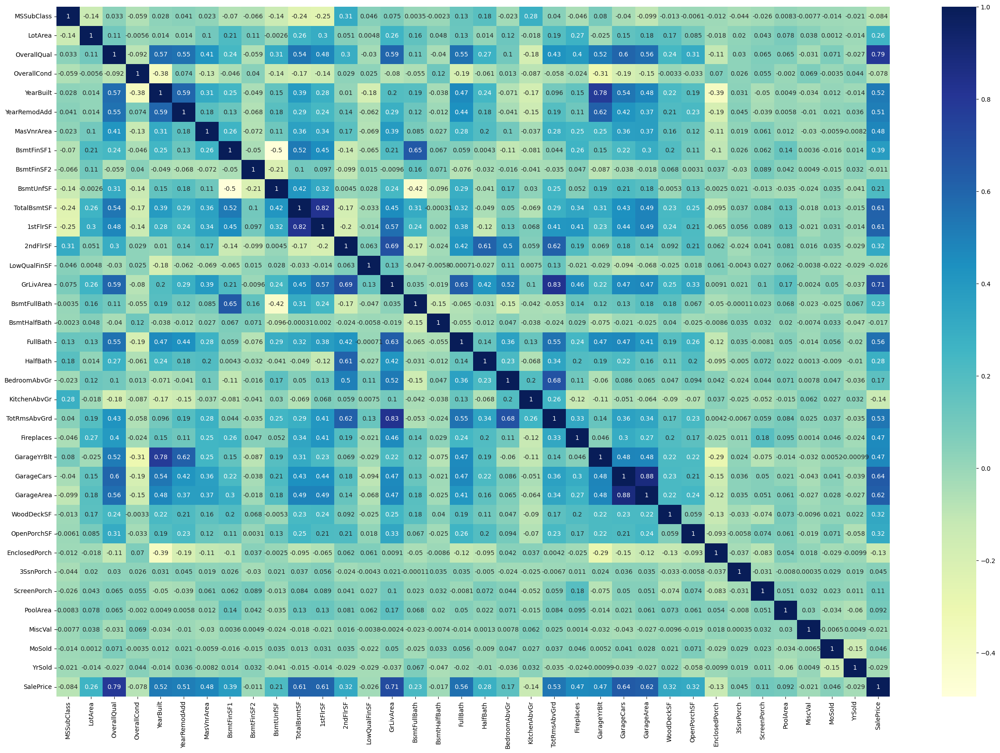

In [17]:
corr_df = house_df.corr()
print("Numerical columns -", len(corr_df.columns))
plt.figure(figsize = (30,20))
sns.heatmap(corr_df, cmap="YlGnBu", annot=True)
plt.show()

In [18]:
# just creating a copy.. if any mistake happens with input dataset
house_df_copy2 = house_df

### Let's drop numercial columns having correlation greater than 80 percent

In [19]:
corr_df2 = corr_df[(corr_df > 0.8) & (corr_df != 1.0)].dropna(how="all")
corr_df3 = corr_df2[(corr_df2 > 0.8) & (corr_df2 != 1.0)].dropna(how="all", axis=1)
corr_df3

corr_80per = []
for row in corr_df3:
    data = corr_df3[row].dropna()
    if row in house_df.columns:
        print(row, "Dropped -", data.index[0])
        house_df = house_df.drop(data.index[0], axis=1)
        corr_80per.append(data.index[0])

TotalBsmtSF Dropped - 1stFlrSF
GrLivArea Dropped - TotRmsAbvGrd
GarageCars Dropped - GarageArea


In [20]:
# variables - numerical and categorical
numerical_cols = [col for col in corr_df.columns if col not in corr_80per]
categorical_cols = [col for col in house_df.columns if col not in numerical_cols]

In [21]:
print("Numerical columns -", len(numerical_cols))
print(numerical_cols)
print("Categorical columns -", len(categorical_cols))
print(categorical_cols)

Numerical columns - 33
['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']
Categorical columns - 38
['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'S

### Data visualization for categorical columns

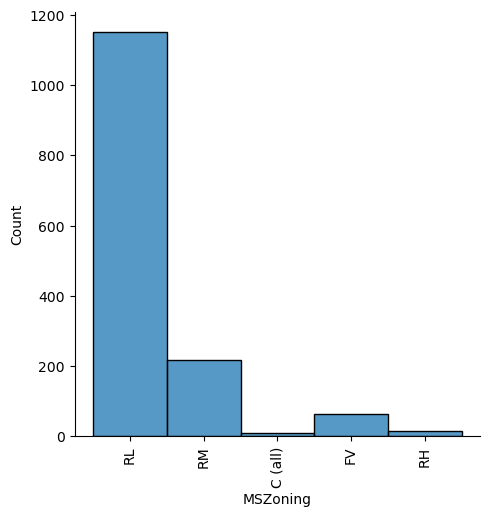

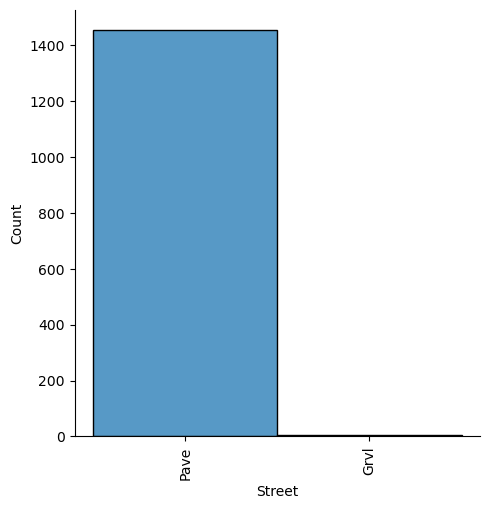

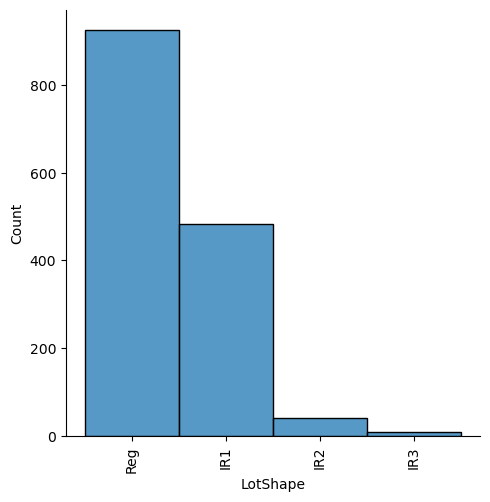

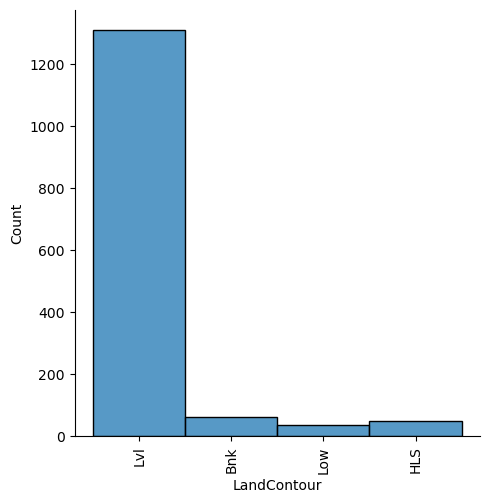

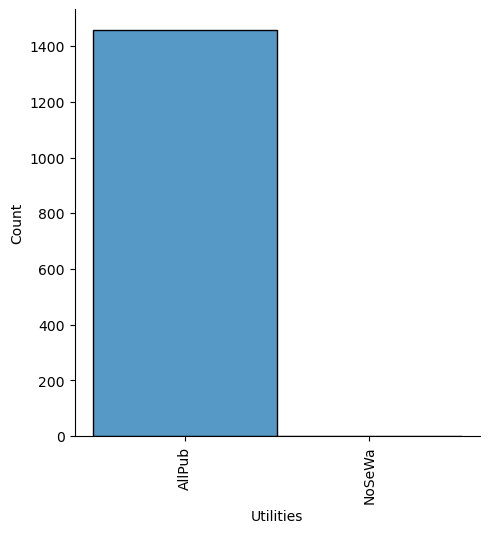

...

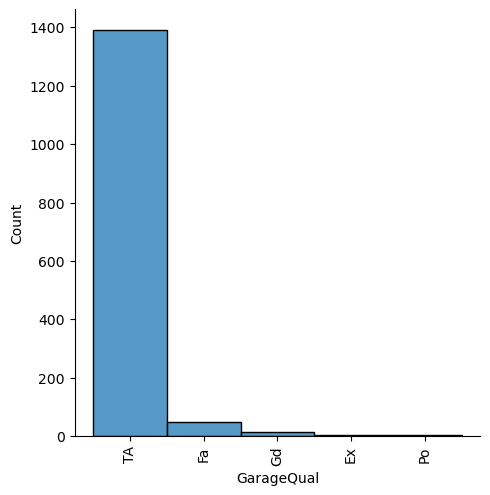

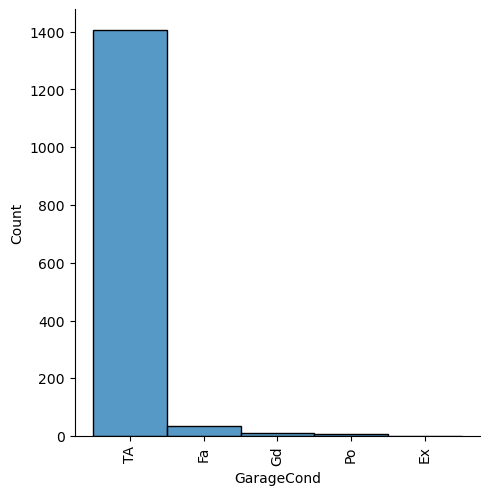

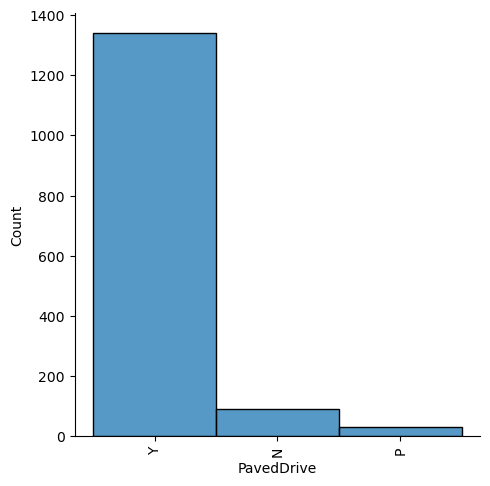

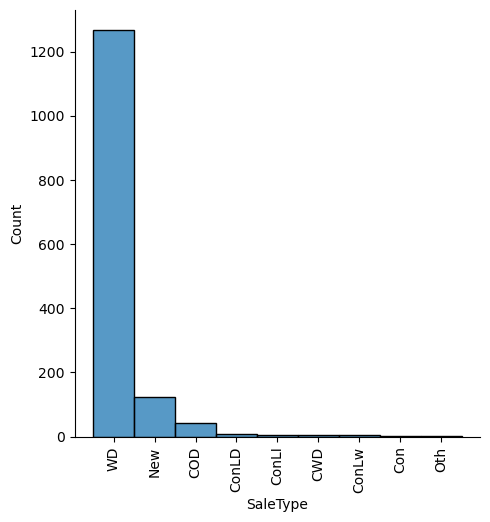

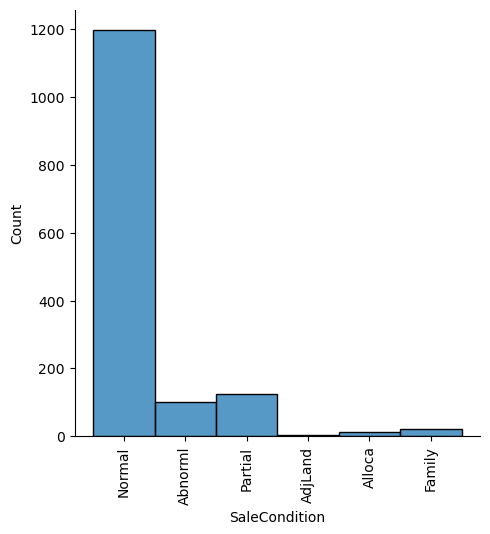

In [22]:
for col in categorical_cols:
    sns.displot(house_df[col])
    plt.xticks(rotation=90)
    plt.show()

### Data visualization for numerical columns

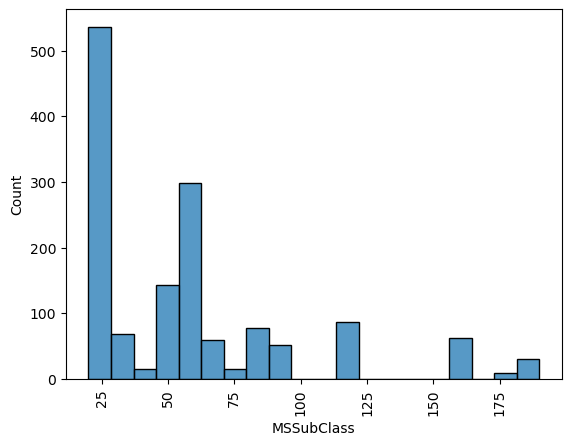

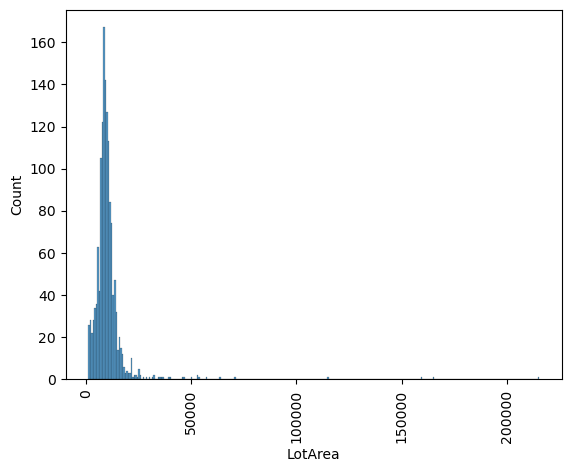

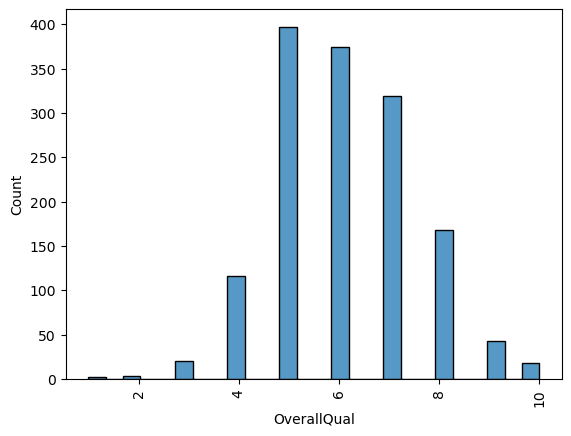

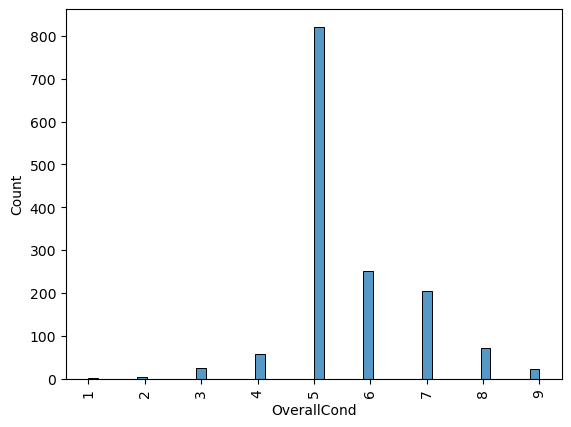

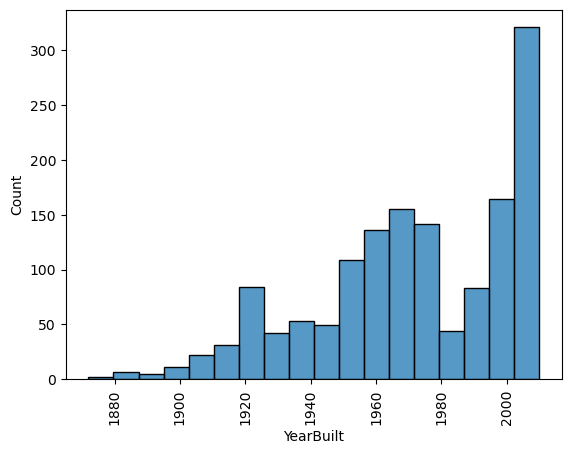

...

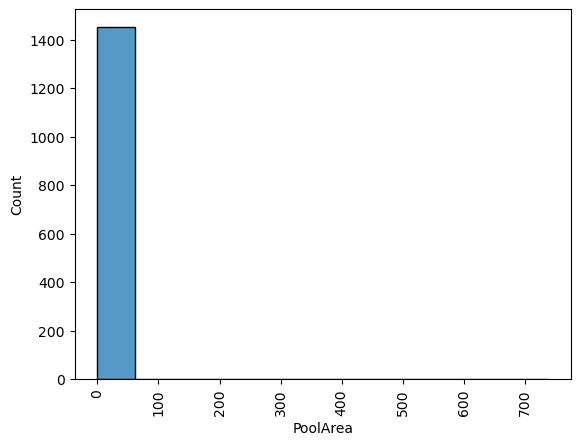

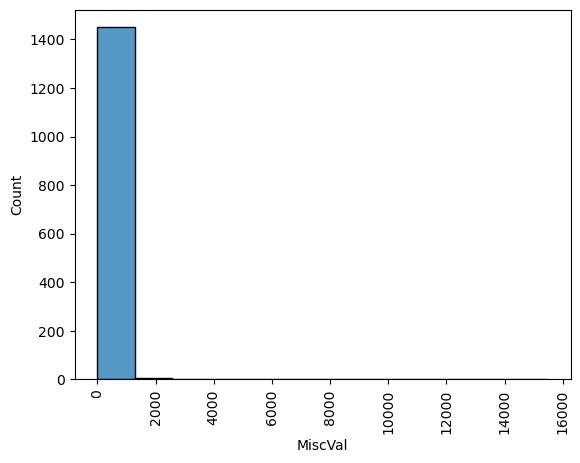

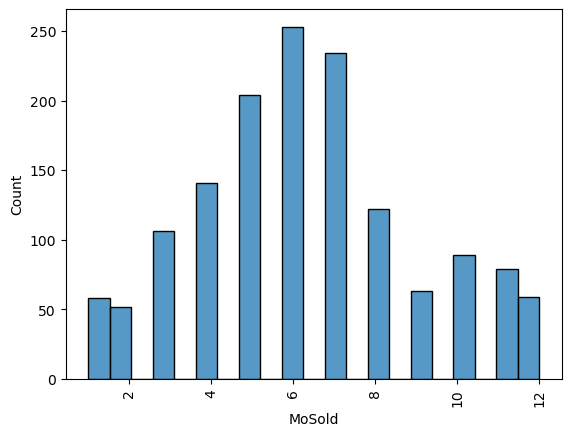

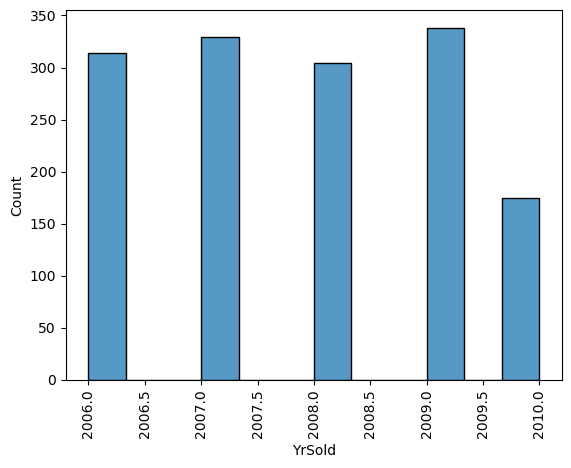

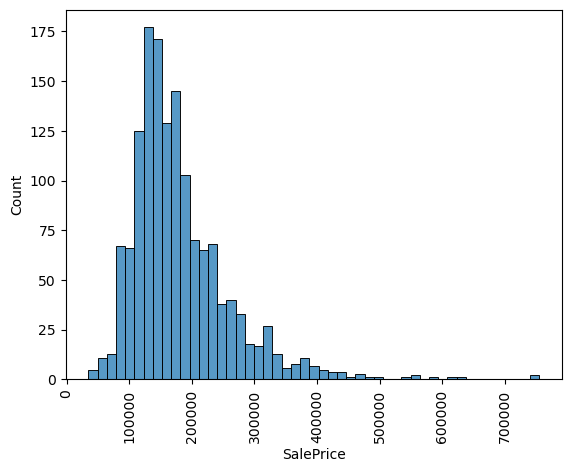

In [23]:
for col in numerical_cols:
    splot = sns.histplot(house_df[col])
    plt.xticks(rotation=90)
    plt.show()

In [24]:
# just printing unique values for each categorical column
for col in categorical_cols:
    print("Column Name -", col)
    print(house_df[col].value_counts())
    print(20*"-")

Column Name - MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
--------------------
Column Name - Street
Pave    1454
Grvl       6
Name: Street, dtype: int64
--------------------
Column Name - LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64
--------------------
Column Name - LandContour
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64
--------------------
Column Name - Utilities
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64
--------------------
Column Name - LotConfig
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
--------------------
Column Name - LandSlope
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64
--------------------
Column Name - Neighborhood
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawye

### dummy_variable_creation for categorical columns -->

In [25]:
for col in categorical_cols:
    col_data = pd.get_dummies(house_df[col], drop_first=True, prefix=col)
    house_df = pd.concat([house_df, col_data], axis=1)
    house_df = house_df.drop(col, axis=1)

In [26]:
# displaying dataframe after creating dummy variables 
house_df

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageYrBlt,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,8450,7,5,2003,2003,196.0,706,0,150,856,854,0,1710,1,0,2,1,3,1,0,2003.0,2,0,61,0,0,0,0,0,2,2008,208500,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1

### So far we have checked correlation for numerical columns, now let's check for categorical columns (converted into dummy variables)

dummy variables - 196


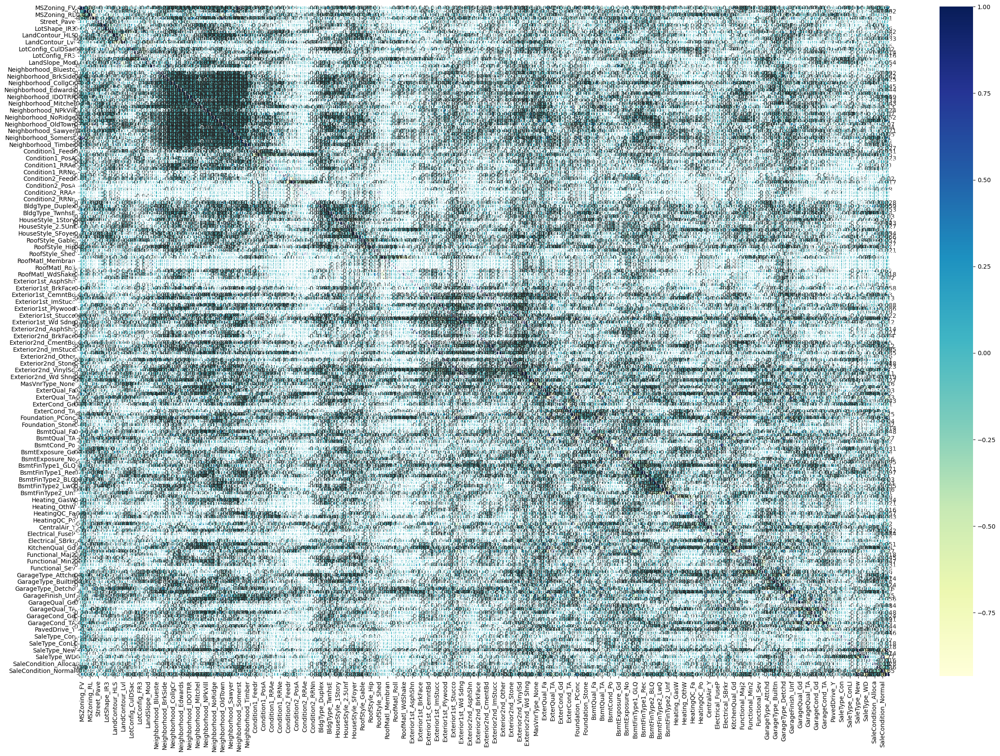

In [27]:
cat_corr_df = house_df.drop(numerical_cols, axis=1).corr()
print("dummy variables -", len(cat_corr_df.columns))
plt.figure(figsize = (30,20))
sns.heatmap(cat_corr_df, cmap="YlGnBu", annot=True)
plt.show()

### As there are 196 variables, we can't really see the values in heatmap.. So, let's remove variables which are 80% or more correlated.

In [28]:
cat_corr_df2 = cat_corr_df[(cat_corr_df > 0.8) & (cat_corr_df != 1.0)].dropna(how="all")
cat_corr_df3 = cat_corr_df2[(cat_corr_df2 > 0.8) & (cat_corr_df2 != 1.0)].dropna(how="all", axis=1)
cat_corr_df3

cat_corr_80per = []
for row in cat_corr_df3:
    data = cat_corr_df3[row].dropna()
    if row in house_df.columns:
        print(row, "Dropped -", data.index[0])
        house_df = house_df.drop(data.index[0], axis=1)
        cat_corr_80per.append(data.index[0])

MSZoning_FV Dropped - Neighborhood_Somerst
Exterior1st_CemntBd Dropped - Exterior2nd_CmentBd
Exterior1st_HdBoard Dropped - Exterior2nd_HdBoard
Exterior1st_MetalSd Dropped - Exterior2nd_MetalSd
Exterior1st_VinylSd Dropped - Exterior2nd_VinylSd
Exterior1st_Wd Sdng Dropped - Exterior2nd_Wd Sdng
SaleType_New Dropped - SaleCondition_Partial


### Let's display our final house data (after removing correlated variables (both numerical and categorical)

In [29]:
house_df

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageYrBlt,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_ImStucc,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
0,60,8450,7,5,2003,2003,196.0,706,0,150,856,854,0,1710,1,0,2,1,3,1,0,2003.0,2,0,61,0,0,0,0,0,2,2008,208500,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,1
1,20,9600,6,8,1976,1976,

In [31]:
# since all columns are converted into numerical ones.. describing dataframe again.
house_df.describe()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageYrBlt,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_ImStucc,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000

### Train test split

In [32]:
np.random.seed(0)
house_train, house_test = train_test_split(house_df, train_size=0.70, test_size=0.30, random_state=100)

### Rescaling

In [33]:
scaler = MinMaxScaler()
# picking only those columns whose max value is greater than 1 (because minmax scaler brings value between [0,1])
numerical_vars = ["MSSubClass", "LotArea", "OverallQual", "OverallCond", "YearBuilt", "YearRemodAdd", "MasVnrArea", 
                  "BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "2ndFlrSF", "LowQualFinSF", "GrLivArea", 
                  "BsmtFullBath", "BsmtHalfBath", "FullBath", "HalfBath", "BedroomAbvGr", "KitchenAbvGr", "Fireplaces", 
                  "GarageYrBlt", "GarageCars", "WoodDeckSF", "OpenPorchSF", "EnclosedPorch", "3SsnPorch", "ScreenPorch", 
                  "PoolArea", "MiscVal", "MoSold", "YrSold", "SalePrice"]
house_train[numerical_vars] = scaler.fit_transform(house_train[numerical_vars])

In [34]:
# transform test data and not fitting..
house_test[numerical_vars] = scaler.transform(house_test[numerical_vars])

In [35]:
# now we can see that min and max value for train dataset are between 0 and 1 respectively
house_train.describe()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageYrBlt,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_ImStucc,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000

In [36]:
# since scaler is fitted on train data, so it will transform test data according to parameters learned on train data..
house_test.describe()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageYrBlt,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_ImStucc,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
count,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.0,438.000000,43

## Linear Regression

In [37]:
reg = LinearRegression()
y = house_train.pop("SalePrice")
reg.fit(house_train,y)

LinearRegression()

In [38]:
# Predictions on the basis of the model
y_pred = reg.predict(house_train)
y_test = house_test.pop("SalePrice")
y_pred

array([0.08085966, 0.40623093, 0.12092829, ..., 0.51483822, 0.39584828,
       0.09633446])

In [39]:
# printing r2 score for train data
r2_score(y, y_pred)

0.9476815634145603

In [40]:
# calculate various metrics for train and test data
y_pred_train = reg.predict(house_train)
y_pred_test = reg.predict(house_test)

metric = []
r2_train_lr = r2_score(y, y_pred_train)
print(r2_train_lr)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print(r2_test_lr)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y - y_pred_train))
print(rss1_lr)
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print(rss2_lr)
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y, y_pred_train)
print(mse_train_lr)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print(mse_test_lr)
metric.append(mse_test_lr**0.5)

0.9476815634145603
-5.271752502271951e+18
0.6437798510317996
2.8656304090870907e+19
0.0006305385416570025
6.5425351805641336e+16


### Calculate r2 scores for various lambda values (hyperparameter) in ridge regression

In [42]:
lambdas = [0.0001, 0.0002, 0.001, 0.01, 0.02, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ] 

# Higher the value of lambda, # more the regularization
for i in lambdas: # for each lambda we get different model coefficients
    ridgereg = Ridge(alpha = i) # Initialize the Ridge Regression model with a specific lambda
    ridgereg.fit(house_train, y) # fit the model on features
    
    #Computing the r2 score
    y_train_pred = ridgereg.predict(house_train)
    y_test_pred = ridgereg.predict(house_test)
    print("lambda =", str(i), ", train r2 score = " + str(r2_score(y, y_train_pred)), ", test r2 score = " + str(r2_score(y_test, y_test_pred)))
#     print(ridgereg.coef_) # model coefficients


lambda = 0.0001 , train r2 score = 0.9476817591906075 , test r2 score = 0.8280791913582889
lambda = 0.0002 , train r2 score = 0.9476813758463641 , test r2 score = 0.8281916558075223
lambda = 0.001 , train r2 score = 0.9476694931252387 , test r2 score = 0.829066422068296
lambda = 0.01 , train r2 score = 0.9467875277556862 , test r2 score = 0.8365350665419385
lambda = 0.02 , train r2 score = 0.9450532664650667 , test r2 score = 0.8416345099248399
lambda = 0.05 , train r2 score = 0.9395883720524363 , test r2 score = 0.8490823821191043
lambda = 0.1 , train r2 score = 0.9330683967425296 , test r2 score = 0.8541062725226009
lambda = 0.2 , train r2 score = 0.9258700280576377 , test r2 score = 0.8588676555621265
lambda = 0.3 , train r2 score = 0.9217613813709927 , test r2 score = 0.8616789679224599
lambda = 0.4 , train r2 score = 0.9189102248786872 , test r2 score = 0.8636009753450852
lambda = 0.5 , train r2 score = 0.9167140375306726 , test r2 score = 0.8649792183571916
lambda = 0.6 , train r

## Doing same for lasso regression

In [43]:
lambdas = [0.0001, 0.0002, 0.001, 0.01, 0.02, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ] # Higher the value of lambda, 
                                                  # more the regularization
for i in lambdas: # for each lambda we get different model coefficients
    lassoreg = Lasso(alpha = i) # Initialize the Ridge Regression model with a specific lambda
    lassoreg.fit(house_train, y) # fit the model on the polynomial features

    #Computing the r2 score
    y_train_pred = lassoreg.predict(house_train)
    y_test_pred = lassoreg.predict(house_test)
    print("lambda =", str(i), ", train r2 score = " + str(r2_score(y, y_train_pred)), ", test r2 score = " + str(r2_score(y_test, y_test_pred)))
#     print(ridgereg.coef_) # model coefficients


lambda = 0.0001 , train r2 score = 0.9044069236756049 , test r2 score = 0.860555630965746
lambda = 0.0002 , train r2 score = 0.8905176903281711 , test r2 score = 0.8633957813639528
lambda = 0.001 , train r2 score = 0.8299727782708679 , test r2 score = 0.8135612970553951
lambda = 0.01 , train r2 score = 0.41207805598535363 , test r2 score = 0.3762241921569124
lambda = 0.02 , train r2 score = 0.24566535576158222 , test r2 score = 0.22655643572234418
lambda = 0.05 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.1 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.2 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.3 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.4 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.5 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.6 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
l

### From r2 scores we can decide which lambda value is best for ridge and lasso, but let's check what cross validation gives us --

In [44]:
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(house_train, y) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [45]:
# printing best value
print(model_cv.best_params_)

{'alpha': 0.01}


In [46]:
# now training ridge regression for above suggested best value 
alpha = 0.01
ridge = Ridge(alpha=alpha)

ridge.fit(house_train, y)
# print(ridge.coef_)

Ridge(alpha=0.01)

In [47]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(house_train)
y_pred_test = ridge.predict(house_test)

metric2 = []
r2_train_lr = r2_score(y, y_pred_train)
print("train r2 score", r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("test r2 score", r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y - y_pred_train))
print("train rss score", rss1_lr)
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("test rss score", rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y, y_pred_train)
print("train mse score", mse_train_lr)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("test mse score", mse_test_lr)
metric2.append(mse_test_lr**0.5)

train r2 score 0.9467875277556862
test r2 score 0.8365350665419385
train rss score 0.6547809852561988
test rss score 0.888566153162427
train mse score 0.0006413134037768842
test mse score 0.0020286898474028013


In [48]:
# lasso regression for above list of alpha values
lasso = Lasso()

# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(house_train, y) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [49]:
# best parameter value suggested by cross validation technique
print(model_cv.best_params_)

{'alpha': 0.0001}


In [50]:
# now training lasso regression for above suggested best value 
alpha =0.0001
lasso = Lasso(alpha=alpha)
lasso.fit(house_train, y) 

Lasso(alpha=0.0001)

In [51]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = lasso.predict(house_train)
y_pred_test = lasso.predict(house_test)

metric3 = []
r2_train_lr = r2_score(y, y_pred_train)
print("train r2 score", r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
print("test r2 score", r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y - y_pred_train))
print("train rss score", rss1_lr)
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
print("test rss score", rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y, y_pred_train)
print("train mse score", mse_train_lr)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
print("test mse score", mse_test_lr)
metric3.append(mse_test_lr**0.5)

train r2 score 0.9044069236756049
test r2 score 0.860555630965746
train rss score 1.1762755245044438
test rss score 0.7579946594767253
train mse score 0.0011520818065665463
test mse score 0.001730581414330423


In [52]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

rg_metric = pd.Series(metric2, name = 'Ridge Regression')
ls_metric = pd.Series(metric3, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score (Train),9.476816e-01,0.946788,0.904407
1,R2 Score (Test),-5.271753e+18,0.836535,0.860556
2,RSS (Train),6.437799e-01,0.654781,1.176276
3,RSS (Test),2.865630e+19,0.888566,0.757995
4,MSE (Train),2.511053e-02,0.025324,0.033942
5,MSE (Test),2.557838e+08,0.045041,0.041600


In [53]:
# checking how many parameters are positive in ridge regression model
np.sum(ridge.coef_ > 0)

109

In [54]:
# checking how many parameters are positive in lasso regression model
np.sum(lasso.coef_ > 0)

61

In [55]:
# printing top 7 most important predictors for ridge regression (alpha = 0.01)
ridge_list = []
for index, value in enumerate(ridge.coef_):
    if value > 0:
        ridge_list.append((house_train.columns[index], value))

In [56]:
sorted(ridge_list, key = lambda x: x[1], reverse=True)[:7]

[('RoofMatl_Membran', 0.9300201394503722),
 ('RoofMatl_WdShngl', 0.9288688068986461),
 ('RoofMatl_Metal', 0.8657995132817529),
 ('RoofMatl_CompShg', 0.8446156808007839),
 ('RoofMatl_Tar&Grv', 0.8440547383218818),
 ('RoofMatl_Roll', 0.8208137455090198),
 ('RoofMatl_WdShake', 0.8162861009028518)]

In [57]:
# printing top 7 most important predictors for lasso regression (alpha = 0.0001)
lasso_list = []
for index, value in enumerate(lasso.coef_):
    if value > 0:
        lasso_list.append((house_train.columns[index], value))

In [58]:
sorted(lasso_list, key = lambda x: x[1], reverse=True)[:7]

[('GrLivArea', 0.33054645710849184),
 ('RoofMatl_WdShngl', 0.12082305925149742),
 ('OverallQual', 0.12033305320091128),
 ('Neighborhood_NoRidge', 0.06234313898211201),
 ('GarageCars', 0.049778770670212594),
 ('2ndFlrSF', 0.04245026688064871),
 ('LotArea', 0.04089192708656565)]

<b> Question1. What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented? </b><br>
<b>Answer - </b><br>
<b>GridSearchCV</b> gives below lambda/alpha values as best hyperparameter values -
1. Ridge - 0.01 => Train r2 score - 0.946788, Test r2 score - 0.836535
2. Lasso - 0.0001 => Train r2 score - 0.904407, Test r2 score - 0.860556
<br>

Based on coefficients' value in both model, below are the important predictor variables
1. Ridge <br>
('RoofMatl_Membran', 'RoofMatl_WdShngl', 'RoofMatl_Metal', 'RoofMatl_CompShg', 'RoofMatl_Tar&Grv') <br>
2. Lasso <br>
('GrLivArea', 'RoofMatl_WdShngl', 'OverallQual', 'Neighborhood_NoRidge', 'GarageCars')<br>

<br>
Now, if we double these lambda values, let's see impact on train and test r2 scores - <br>
1. Ridge - 0.02 => Train - 0.945053 , Test - 0.841634 <br>
2. Lasso - 0.0002 => Train - 0.890517, Test - 0.863395
<br>
Based on coefficients' value in both model, below are the important predictor variables <br>
1. Ridge <br>
('RoofMatl_WdShngl', 'RoofMatl_Membran', 'RoofMatl_CompShg', 'RoofMatl_Metal', 'RoofMatl_Tar&Grv') <br>
2. Lasso <br>
('GrLivArea', 'OverallQual', 'RoofMatl_WdShngl', 'Neighborhood_NoRidge', 'GarageCars')<br>
-----------------------------------------------------------------------------------------

<br>
But when we see the best model ourselves (based on difference between train and test r2 scores) - <br>
1. Ridge - 2.0 => Train - 0.902400, Test - 0.868895  (Calculating train test scores in next command for this lambda value)
<br>
2. Lasso - 0.0001 => Train - 0.904407, Test - 0.860556 (Same as above)
<br><br>
Important predictors for this Ridge model (which are almost similar to Lasso model) - <br>
('GrLivArea', 'OverallQual', 'RoofMatl_WdShngl', '2ndFlrSF', 'Neighborhood_NoRidge')
<br> Now, we can clearly see that this Ridge model (with parameter alpha = 2 is most similar to lasso one)


In [72]:
alpha = 2.0
ridge = Ridge(alpha=alpha)
ridge.fit(house_train, y)
y_train_pred = ridge.predict(house_train)
y_test_pred = ridge.predict(house_test)
print("lambda =", str(alpha), ", train r2 score = " + str(r2_score(y, y_train_pred)), ", test r2 score = " + str(r2_score(y_test, y_test_pred)))
ridge_list = []
for index, value in enumerate(ridge.coef_):
    if value > 0:
        ridge_list.append((house_train.columns[index], value))
print("5 most important predictor variables (with their corresponding parameter values) -")
print(sorted(ridge_list, key = lambda x: x[1], reverse=True)[:5])

lambda = 2.0 , train r2 score = 0.9024003874107797 , test r2 score = 0.8688950895764876
5 most important predictor variables (with their corresponding parameter values) -
[('GrLivArea', 0.14213647398982626), ('OverallQual', 0.10029191603236404), ('RoofMatl_WdShngl', 0.09971033329834687), ('2ndFlrSF', 0.09574635377692853), ('Neighborhood_NoRidge', 0.06184044826720594)]


----
<b> Question 2 - You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?</b> <br>
<b> Answer -</b><br>
K-fold cross validation (GridSearchCV) has given best hyperparameters for Ridge and Lasso regression as 0.01 and 0.0001 respectively. The test r2 scores for Ridge and Lasso are 0.8365 and 0.8605 respectively. So, in that sense Lasso is doing better, so we will choose this. Also, we know that Lasso regression does feature selection and eliminates features which are not required. We have already seen in above commands that Lasso with alpha = 0.0001 has selected 61 columns and made all other features as 0. So, we will choose Lasso regression with alpha = 0.0001. 


----
<b> Question 3 - After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now? </b><br>
<b> Answer -</b>
From answer 1, we found the 5 most important predictor variables (given by Lasso Regression) are - <br>
('GrLivArea', 'OverallQual', 'RoofMatl_WdShngl', 'Neighborhood_NoRidge', 'GarageCars')<br>
Now, let's try to drop these variables, train the lasso regression and again find the 5 most important predictor variables..<br>
From below few commands, the alpha/lambda for lasso regression is still 0.0001 and results for same are - <br>
<b> lambda = 0.0001 , train r2 score = 0.8759 , test r2 score = 0.8299 </b> <br>
And 5 most important predictor variables now are - <br>
('TotalBsmtSF', '2ndFlrSF', 'LotArea', 'MasVnrArea', 'FullBath')

In [64]:
# let's drop most important 5 predictors and train the lasso model again.. 
house_train_drop5 = house_train.drop(['GrLivArea', 'OverallQual', 'RoofMatl_WdShngl', 'Neighborhood_NoRidge', 'GarageCars'],
                                     axis = 1)
house_test_drop5 = house_test.drop(['GrLivArea', 'OverallQual', 'RoofMatl_WdShngl', 'Neighborhood_NoRidge', 'GarageCars'],
                                     axis = 1)
lambdas = [0.0001, 0.0002, 0.001, 0.01, 0.02, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ] # Higher the value of lambda, more the regularization
for i in lambdas: # for each lambda we get different model coefficients
    lassoreg = Lasso(alpha = i) # Initialize the lasso Regression model with a specific lambda
    lassoreg.fit(house_train_drop5, y) 

    #Computing the r2 score
    y_train_pred = lassoreg.predict(house_train_drop5)
    y_test_pred = lassoreg.predict(house_test_drop5)
    print("lambda =", str(i), ", train r2 score = " + str(r2_score(y, y_train_pred)), ", test r2 score = " + str(r2_score(y_test, y_test_pred)))

lambda = 0.0001 , train r2 score = 0.8758828355008748 , test r2 score = 0.8299848498144733
lambda = 0.0002 , train r2 score = 0.8576168827326286 , test r2 score = 0.8288045385450454
lambda = 0.001 , train r2 score = 0.7769456633481315 , test r2 score = 0.7661736467683777
lambda = 0.01 , train r2 score = 0.41207777152204206 , test r2 score = 0.3762238577898127
lambda = 0.02 , train r2 score = 0.24566535576158222 , test r2 score = 0.22655643572234418
lambda = 0.05 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.1 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.2 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.3 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.4 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.5 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076
lambda = 0.6 , train r2 score = 0.0 , test r2 score = -0.00030262183303753076


In [66]:
# from above results, we can see lasso corresponding to alpha = 0.0001 is doing the best..
alpha =0.0001
lasso = Lasso(alpha=alpha)
lasso.fit(house_train_drop5, y) 

lasso_list = []
for index, value in enumerate(lasso.coef_):
    if value > 0:
        lasso_list.append((house_train_drop5.columns[index], value))

sorted(lasso_list, key = lambda x: x[1], reverse=True)[:5]

[('TotalBsmtSF', 0.24675983784469419),
 ('2ndFlrSF', 0.2064463657624951),
 ('LotArea', 0.09331247677244572),
 ('MasVnrArea', 0.06787943593176744),
 ('FullBath', 0.05842795813575176)]

<b> Question 4 - How can you make sure that a model is robust and generalisable? What are the implications of the same for the accuracy of the model and why? </b> <br>
<b> Answer - </b> <br>
We can make sure that model is robust and generalisable by taking care of bias - variance trade-off. The model should have balance between bias and variance, it should not be like - model is having very less training error (low bias) but has very high test error (high variance). We can have training accuracy a bit low (than overfit case) but test accuracy similar to training one. Here in our case (from 1st question), we have chosen ridge regression with lambda/alpha = 2, because for that case r2 score  difference between train and test data is less as compared to ridge regression with lambda/alpha = 0.01.
We can see that there are some implications on training score, because to avoid overfitting, our training score/accuracy will get lower a bit. But then our model will be more robust and works fine for unseen test data. 